In [18]:
import pandas as pd
import numpy as np

from glob import glob
import os

import matplotlib.pyplot as plt
import seaborn as sb

from sklearn.ensemble import RandomForestClassifier


Goal: The goal of this hackathon is to predict GreatStone’s rating of a mutual fund. In order to help investors decide on which mutual fund to pick for an investment, the task is to build a model that can predict the rating of a mutual fund. The various attributes that define a mutual fund can be used for building the model.

Datasets:
bond_ratings, fund_allocations, fund_config, fund_ratios, fund_specs, oth- er_specs, return_3year, return_5year, return_10year.

Evaluation : Mean Precision Value - Mean of precision of all the classes = P1+P2..... P6/6 Here P1 is Precision of Class 1 and P2 is Precision of Class2 and so on and so forth.

In [100]:
data_bondrating = pd.read_csv('/Users/shiva/Downloads/external/bond_ratings.csv')
data_fundalloc = pd.read_csv('/Users/shiva/Downloads/external/fund_allocations.csv')
data_fundconfig = pd.read_csv('/Users/shiva/Downloads/external/fund_config.csv')
data_fundratio = pd.read_csv('/Users/shiva/Downloads/external/fund_ratios.csv')
data_fundspec = pd.read_csv('/Users/shiva/Downloads/external/fund_specs.csv')
data_otherspec = pd.read_csv('/Users/shiva/Downloads/external/other_specs.csv')
data_return3 = pd.read_csv('/Users/shiva/Downloads/external/return_3year.csv')
data_return5 = pd.read_csv('/Users/shiva/Downloads/external/return_5year.csv')
data_return10 = pd.read_csv('/Users/shiva/Downloads/external/return_10year.csv')

In [101]:
print (data_bondrating.shape,data_fundalloc.shape,data_fundconfig.shape,data_fundratio.shape,data_fundspec.shape)
print (data_otherspec.shape,data_return3.shape,data_return5.shape,data_return10.shape)

(25000, 12) (25000, 12) (25000, 4) (25000, 8) (25000, 9)
(25000, 43) (25000, 17) (25000, 17) (25000, 17)


In [102]:
column_1 = ['portfolio_communication_allocation', 'portfolio_financial_services',
       'portfolio_industrials_allocation', 'portfolio_tech_allocation',
       'portfolio_materials_basic_allocation', 'portfolio_energy_allocation',
       'portfolio_consumer_defence_allocation',
       'portfolio_healthcare_allocation', 'portfolio_property_allocation',
       'tag', 'portfolio_utils_allocation',
       'portfolio_cyclical_consumer_allocation']
data_fundalloc.columns = column_1

In [103]:
column_2 = ['category', 'parent_company', 'tag', 'fund_name']
data_fundconfig.columns =column_2

In [23]:
column_3 = ['10years_category_r_squared', '10yrs_sharpe_ratio_fund',
       '10_years_alpha_fund', '10years_fund_r_squared', '10years_fund_std',
       '10yrs_sharpe_ratio_category', '10_years_beta_fund',
       '10yrs_treynor_ratio_fund', 'tag',
       '10_years_return_mean_annual_category', '10yrs_treynor_ratio_category',
       '10_years_return_fund', '10_years_alpha_category',
       '10_years_beta_category', '10years_category_std',
       '10_years_return_mean_annual_fund', '10_years_return_category']
data_return10.columns = column_3

In [24]:
print (data_bondrating.columns,data_fundalloc.columns,data_fundconfig.columns,data_fundratio.columns,data_fundspec.columns)
print (data_otherspec.columns,data_return3.columns,data_return5.columns,data_return10.columns)


Index(['bb_rating', 'us_govt_bond_rating', 'below_b_rating', 'others_rating',
       'maturity_bond', 'b_rating', 'tag', 'a_rating', 'aaa_rating',
       'aa_rating', 'bbb_rating', 'duration_bond'],
      dtype='object') Index(['portfolio_communication_allocation', 'portfolio_financial_services',
       'portfolio_industrials_allocation', 'portfolio_tech_allocation',
       'portfolio_materials_basic_allocation', 'portfolio_energy_allocation',
       'portfolio_consumer_defence_allocation',
       'portfolio_healthcare_allocation', 'portfolio_property_allocation',
       'tag', 'portfolio_utils_allocation',
       'portfolio_cyclical_consumer_allocation'],
      dtype='object') Index(['category', 'parent_company', 'tag', 'fund_name'], dtype='object') Index(['fund_id', 'tag', 'fund_ratio_net_annual_expense', 'pb_ratio',
       'ps_ratio', 'mmc', 'pc_ratio', 'pe_ratio'],
      dtype='object') Index(['investment_class', 'currency', 'total_assets', 'yield',
       'greatstone_rating', 'inc

In [25]:
data_bondrating.head()

,bb_rating,us_govt_bond_rating,below_b_rating,others_rating,maturity_bond,b_rating,tag,a_rating,aaa_rating,aa_rating,bbb_rating,duration_bond
0,0.0,0.0,0.0,0.0,NaN,0.0,67922,0.0,0.0,0.0,0.0,NaN
1,0.0,0.0,0.0,0.0,NaN,0.0,134783,0.0,0.0,0.0,0.0,NaN
2,0.0,0.0,0.0,0.0,NaN,0.0,61271,0.0,0.0,0.0,0.0,NaN
3,0.0,0.0,0.0,0.0,NaN,0.0,64412,0.0,0.0,0.0,0.0,NaN
4,0.0,0.0,0.0,0.0,NaN,0.0,184058,0.0,0.0,0.0,0.0,NaN


In [26]:
data_fundalloc.head()

,portfolio_communication_allocation,portfolio_financial_services,portfolio_industrials_allocation,portfolio_tech_allocation,portfolio_materials_basic_allocation,portfolio_energy_allocation,portfolio_consumer_defence_allocation,portfolio_healthcare_allocation,portfolio_property_allocation,tag,portfolio_utils_allocation,portfolio_cyclical_consumer_allocation
0,0.00,0.00,0.00,0.00,0.00,100.00,0.00,0.00,0.00,67922,0.00,0.00
1,0.78,9.77,9.97,35.51,2.86,0.38,5.88,14.41,2.67,134783,0.39,17.38
2,4.70,16.40,11.45,25.09,8.36,0.00,9.42,16.47,1.03,61271,0.00,7.09
3,6.53,13.80,10.91,0.16,2.22,6.79,25.73,9.00,0.00,64412,19.42,5.43
4,3.49,13.95,10.51,19.26,3.75,5.11,7.29,12.22,10.41,184058,3.07,10.95


In [27]:
data_fundratio.tail()

,fund_id,tag,fund_ratio_net_annual_expense,pb_ratio,ps_ratio,mmc,pc_ratio,pe_ratio
24995,c3d73c76-6b0c-4ee4-b562-e9bff53e4c8c,142001,1.12,1.78,1.11,"45,619.69",8.64,11.3
24996,12fc8949-6563-4dd4-a7cc-0400131fa6ab,40598,1.02,1.94,1.36,"37,550.75",7.61,14.3
24997,7fe4b63a-c42e-4c2b-a59b-d29ade57ecfd,202562,0.95,1.52,1.5,"7,378.47",4.63,14.49
24998,65421547-1407-4c50-92dc-e1cb1e9972dd,144818,1.10,0.98,0.86,"14,859.2",3.8,7.89
24999,e0284aeb-630a-4499-8745-2a9abba49528,219275,1.97,2.38,1.63,"35,795.28",11.55,17.8


In [104]:
allfiles = sorted(glob('/Users/shiva/Downloads/external/*.csv'))
allfiles

['/Users/shiva/Downloads/external/bond_ratings.csv',
 '/Users/shiva/Downloads/external/fund_allocations.csv',
 '/Users/shiva/Downloads/external/fund_config.csv',
 '/Users/shiva/Downloads/external/fund_ratios.csv',
 '/Users/shiva/Downloads/external/fund_specs.csv',
 '/Users/shiva/Downloads/external/other_specs.csv',
 '/Users/shiva/Downloads/external/return_10year.csv',
 '/Users/shiva/Downloads/external/return_3year.csv',
 '/Users/shiva/Downloads/external/return_5year.csv',
 '/Users/shiva/Downloads/external/sample_submission.csv']

In [105]:
merged_data = pd.concat((pd.read_csv(file) for file in allfiles),ignore_index=False,axis=1)
merged_data

,bb_rating,us_govt_bond_rating,below_b_rating,others_rating,maturity_bond,b_rating,tag,a_rating,aaa_rating,aa_rating,...,5_years_return_mean_annual_category,5yrs_treynor_ratio_category,5_years_return_fund,5_years_alpha_category,5_years_beta_category,5years_category_std,tag,5_years_return_category,fund_id,greatstone_rating
0,0.00,0.0,0.00,0.0,NaN,0.00,67922,0.00,0.0,0.00,...,-0.00,-0.04,0.00,-0.11,0.01,0.20,67922,-4.25,85a6edf9-db47-490c-981a-168ce90434bb,NaN
1,0.00,0.0,0.00,0.0,NaN,0.00,134783,0.00,0.0,0.00,...,0.01,0.10,11.71,-0.00,0.01,0.13,134783,11.26,654dac08-5e5d-4cf0-870e-3167087de7d2,NaN
2,0.00,0.0,0.00,0.0,NaN,0.00,61271,0.00,0.0,0.00,...,0.01,0.10,12.78,-0.00,0.01,0.13,61271,11.26,75214019-f876-42a9-a316-328b759ac4ba,NaN
3,0.00,0.0,0.00,0.0,NaN,0.00,64412,0.00,0.0,0.00,...,0.01,0.07,7.25,-0.03,0.01,0.11,64412,7.20,1fe8de6d-cd33-489e-a829-211f1f622eed,NaN
4,0.00,0.0,0.00,0.0,NaN,0.00,184058,0.00,0.0,0.00,...,0.01,0.04,0.00,-0.01,0.01,0.09,184058,5.95,bd87a7a0-6ca5-4607-a0cf-d396ecd6037a,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
24995,0.00,0.0,0.00,0.0,NaN,0.00,142001,0.00,0.0,0.00,...,0.01,0.07,4.41,-0.03,0.01,0.11,142001,7.20,NaN,NaN
24996,0.00,0.0,0.00,0.0,NaN,0.00,40598,0.00,0.0,0.00,...,0.01,0.06,5.94,0.04,0.01,0.11,40598,5.89,NaN,NaN
24997,24.65,0.0,2.81,4.0,6.85,40.22,202562,3.42,11.7,0.42,...,0.00,0.04,0.00,-0.01,0.01,0.06,202562,3.69,NaN,NaN
24998,0.00,0.0,0.00,0.0,NaN,0.00,144818,0.00,0.0,0.00,...,0.01,0.05,6.92,-0.04,0.01,0.13,144818,6.34,NaN,NaN


In [17]:
#merged_data.to_csv('merged_data.csv')

Columns of Merged data

In [30]:
merged_data.describe()


,bb_rating,us_govt_bond_rating,below_b_rating,others_rating,maturity_bond,b_rating,tag,a_rating,aaa_rating,aa_rating,...,5_years_return_mean_annual_fund,5_years_return_mean_annual_category,5yrs_treynor_ratio_category,5_years_return_fund,5_years_alpha_category,5_years_beta_category,5years_category_std,tag,5_years_return_category,greatstone_rating
count,24886.000000,24886.0,24886.000000,24886.000000,8093.000000,24886.000000,25000.000000,24886.000000,24886.000000,24886.000000,...,21157.000000,24894.000000,24894.000000,24885.000000,24894.000000,24894.000000,24894.000000,25000.000000,24885.000000,0.0
mean,3.473804,0.0,0.827525,1.666769,7.765444,3.234399,139878.934640,5.054436,14.558310,4.209073,...,0.437478,0.003895,0.040969,4.115030,-0.008121,0.008610,0.093149,139878.934640,4.757312,NaN
std,8.299747,0.0,2.700019,6.885158,4.148558,9.197164,65731.287074,9.261811,25.636838,11.164511,...,0.341248,0.005069,0.044379,4.179389,0.026415,0.004012,0.049600,65731.287074,3.409379,NaN
min,0.000000,0.0,-0.020000,-68.210000,0.000000,-0.120000,26000.000000,0.000000,-3.150000,-0.190000,...,-2.960000,-0.010000,-0.160000,-32.750000,-0.180000,-0.020000,0.000000,26000.000000,-17.000000,NaN
25%,0.000000,0.0,0.000000,0.000000,5.460000,0.000000,83021.750000,0.000000,0.000000,0.000000,...,0.230000,0.000000,0.020000,1.230000,-0.020000,0.010000,0.050000,83021.750000,2.610000,NaN
50%,0.000000,0.0,0.000000,0.000000,7.290000,0.000000,139881.500000,0.000000,0.000000,0.000000,...,0.410000,0.000000,0.040000,3.740000,0.000000,0.010000,0.100000,139881.500000,4.230000,NaN
75%,2.450000,0.0,0.100000,0.330000,8.920000,0.710000,196759.250000,8.340000,18.955000,3.010000,...,0.630000,0.010000,0.070000,6.520000,-0.000000,0.010000,0.130000,196759.250000,6.410000,NaN
max,80.470000,0.0,42.300000,100.000000,29.300000,80.680000,253763.000000,72.870000,118.650000,90.220000,...,2.490000,0.010000,0.320000,29.290000,0.080000,0.030000,0.360000,253763.000000,15.260000,NaN


In [31]:
a = merged_data.describe().columns
a

Index(['bb_rating', 'us_govt_bond_rating', 'below_b_rating', 'others_rating',
       'maturity_bond', 'b_rating', 'tag', 'a_rating', 'aaa_rating',
       'aa_rating',
       ...
       '5_years_return_mean_annual_fund',
       '5_years_return_mean_annual_category', '5yrs_treynor_ratio_category',
       '5_years_return_fund', '5_years_alpha_category',
       '5_years_beta_category', '5years_category_std', 'tag',
       '5_years_return_category', 'greatstone_rating'],
      dtype='object', length=119)

In [168]:
from collections import Counter

In [330]:
Counter(non_numeric_list)

NameError: name 'non_numeric_list' is not defined

In [106]:
merged_data.fillna(value=0,inplace=True)

In [109]:
merged_data = merged_data.loc[:,~merged_data.columns.duplicated()]
merged_data

,bb_rating,us_govt_bond_rating,below_b_rating,others_rating,maturity_bond,b_rating,tag,a_rating,aaa_rating,aa_rating,...,5_years_beta_fund,5yrs_treynor_ratio_fund,5_years_return_mean_annual_fund,5_years_return_mean_annual_category,5yrs_treynor_ratio_category,5_years_return_fund,5_years_alpha_category,5_years_beta_category,5years_category_std,5_years_return_category
0,0.00,0.0,0.00,0.0,0.00,0.00,67922,0.00,0.0,0.00,...,0.00,0,0.00,-0.00,-0.04,0.00,-0.11,0.01,0.20,-4.25
1,0.00,0.0,0.00,0.0,0.00,0.00,134783,0.00,0.0,0.00,...,1.05,10.37,0.99,0.01,0.10,11.71,-0.00,0.01,0.13,11.26
2,0.00,0.0,0.00,0.0,0.00,0.00,61271,0.00,0.0,0.00,...,0.86,13.84,1.05,0.01,0.10,12.78,-0.00,0.01,0.13,11.26
3,0.00,0.0,0.00,0.0,0.00,0.00,64412,0.00,0.0,0.00,...,0.69,9.3,0.62,0.01,0.07,7.25,-0.03,0.01,0.11,7.20
4,0.00,0.0,0.00,0.0,0.00,0.00,184058,0.00,0.0,0.00,...,0.00,0,0.00,0.01,0.04,0.00,-0.01,0.01,0.09,5.95
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
24995,0.00,0.0,0.00,0.0,0.00,0.00,142001,0.00,0.0,0.00,...,0.97,3.72,0.41,0.01,0.07,4.41,-0.03,0.01,0.11,7.20
24996,0.00,0.0,0.00,0.0,0.00,0.00,40598,0.00,0.0,0.00,...,0.78,6.55,0.53,0.01,0.06,5.94,0.04,0.01,0.11,5.89
24997,24.65,0.0,2.81,4.0,6.85,40.22,202562,3.42,11.7,0.42,...,0.00,0,0.00,0.00,0.04,0.00,-0.01,0.01,0.06,3.69
24998,0.00,0.0,0.00,0.0,0.00,0.00,144818,0.00,0.0,0.00,...,1.72,3.56,0.78,0.01,0.05,6.92,-0.04,0.01,0.13,6.34


In [84]:
Counter(merged_data['mmc'])# investment_class,fund_size,

Counter({1392: 4,
         5025: 8,
         4880: 4,
         3747: 7,
         3776: 6,
         0: 6122,
         4423: 5,
         3301: 3,
         1848: 8,
         3569: 6,
         3406: 5,
         5277: 1,
         3883: 7,
         2449: 3,
         555: 6,
         2786: 3,
         3453: 7,
         2331: 6,
         1593: 2,
         4526: 16,
         1794: 7,
         4858: 7,
         1238: 6,
         3891: 7,
         4451: 4,
         2942: 9,
         2492: 3,
         5004: 3,
         1699: 6,
         2501: 1,
         4715: 17,
         3284: 8,
         2179: 1,
         3749: 3,
         2790: 8,
         3677: 6,
         11: 4,
         3645: 8,
         3963: 4,
         4417: 5,
         5054: 6,
         3079: 6,
         3620: 5,
         5518: 6,
         615: 4,
         4579: 1,
         5005: 4,
         3493: 4,
         4944: 6,
         4877: 6,
         3469: 1,
         202: 7,
         5573: 2,
         5320: 75,
         4769: 9,
         628

In [331]:
from sklearn import preprocessing
le = preprocessing.LabelEncoder()

In [132]:

merged_data.category = le.fit_transform(merged_data.category)
merged_data.parent_company = le.fit_transform(merged_data.parent_company)
#merged_data.fund_id = le.fit_transform(merged_data.fund_id)
merged_data.fund_name = le.fit_transform(merged_data.fund_name)
merged_data.investment_class = le.fit_transform(merged_data.investment_class.astype(str))
merged_data.currency = le.fit_transform(merged_data.currency)
merged_data.fund_size = le.fit_transform(merged_data.fund_size.astype(str))
merged_data.mmc = le.fit_transform(merged_data.mmc.astype(str))
merged_data.total_assets = le.fit_transform(merged_data.total_assets)
merged_data['3yrs_treynor_ratio_fund'] = le.fit_transform(merged_data['3yrs_treynor_ratio_fund'].astype(str))
merged_data.ps_ratio = le.fit_transform(merged_data.ps_ratio.astype(str))
merged_data.pc_ratio = le.fit_transform(merged_data.pc_ratio.astype(str))
merged_data.pe_ratio = le.fit_transform(merged_data.pe_ratio.astype(str))
merged_data['10yrs_treynor_ratio_fund'] = le.fit_transform(merged_data['10yrs_treynor_ratio_fund'].astype(str))
merged_data['5yrs_treynor_ratio_fund'] = le.fit_transform(merged_data['5yrs_treynor_ratio_fund'].astype(str))


/Users/shiva/anaconda3/anaconda3/lib/python3.7/site-packages/pandas/core/generic.py:5303: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value
/Users/shiva/anaconda3/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  # Remove the CWD from sys.path while we load stuff.
/Users/shiva/anaconda3/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a Data

In [111]:
merged_data.fillna(value=0,inplace=True)

/Users/shiva/anaconda3/anaconda3/lib/python3.7/site-packages/pandas/core/frame.py:4153: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  downcast=downcast,


EDA - hisplot and subplot

In [112]:
merged_data.isnull().sum()

bb_rating                  0
us_govt_bond_rating        0
below_b_rating             0
others_rating              0
maturity_bond              0
                          ..
5_years_return_fund        0
5_years_alpha_category     0
5_years_beta_category      0
5years_category_std        0
5_years_return_category    0
Length: 125, dtype: int64

In [113]:
merged_data.isna().sum()

bb_rating                  0
us_govt_bond_rating        0
below_b_rating             0
others_rating              0
maturity_bond              0
                          ..
5_years_return_fund        0
5_years_alpha_category     0
5_years_beta_category      0
5years_category_std        0
5_years_return_category    0
Length: 125, dtype: int64

Determine the X indepent features

In [51]:
#feature_lis = ['below_b_rating', 'maturity_bond', 'b_rating', 'a_rating', 
               'aaa_rating', 'aa_rating', 'bbb_rating', 'duration_bond', 'portfolio_communication_allocation', 
               'portfolio_financial_services', 'portfolio_industrials_allocation', 'portfolio_tech_allocation', 
               'portfolio_materials_basic_allocation', 'portfolio_energy_allocation', 'portfolio_consumer_defence_allocation', 
               'portfolio_healthcare_allocation', 'portfolio_property_allocation', 'portfolio_utils_allocation', 
               'portfolio_cyclical_consumer_allocation', 'fund_ratio_net_annual_expense',
               'mmc', 'investment_class', 'yield', 'inception_date', 'fund_size', 'return_ytd', '2014_category_return', 
               '2012_return_category', 'years_up', '2018_return_category', 'cash_percent_of_portfolio', 
               '2011_return_category', 'ytd_return_fund', 'years_down', '2014_return_fund']

In [52]:
#drp_list =['greatstone_rating','fund_id','fund_name','ps_ratio','pe_ratio','pc_ratio','10yrs_treynor_ratio_fund',
#           '3yrs_treynor_ratio_fund','5yrs_treynor_ratio_fund','total_assets']

In [53]:
drp_list = []
for i in merged_data.columns:#'others_rating', 'tag', 'id', 'category', 'id', 'currency'
    if (i not in feature_lis):
        drp_list.append(i)

In [114]:
list_fundid = submission.fund_id

In [115]:
list_fundid

0       85a6edf9-db47-490c-981a-168ce90434bb
1       654dac08-5e5d-4cf0-870e-3167087de7d2
2       75214019-f876-42a9-a316-328b759ac4ba
3       1fe8de6d-cd33-489e-a829-211f1f622eed
4       bd87a7a0-6ca5-4607-a0cf-d396ecd6037a
                        ...                 
4995    cd0a6c98-3d60-4548-a9db-493d80702107
4996    5a824843-621b-469f-a7d3-bae5b78beece
4997    acb8601f-bb42-4fe3-9823-c124d38cfc82
4998    e3f00c88-98d9-4a44-930c-891513652f8a
4999    ef6f6819-2879-41c3-9736-ab1bf4d97869
Name: fund_id, Length: 5000, dtype: object

In [161]:
Train_data = merged_data[~merged_data.fund_id.isin(list_fundid)]
Test_data = merged_data[merged_data.fund_id.isin(list_fundid)]

In [177]:
submission.sort_values(by=['fund_id'],inplace=True)

In [326]:
Counter(Test_data.greatstone_rating)

Counter({0.0: 5000})

In [178]:
submission.fund_id

4939    000b6091-3c16-41a1-9df4-fce73767dd21
1389    00189098-b9b7-4dab-805f-6b70ec472fe4
2939    001bb456-672e-4df5-9600-8ec3e45bf9dd
1646    00401fbc-173e-4f10-a610-b4b89682d38f
177     0043dd54-133c-4f14-b4ff-26e5467140b2
                        ...                 
3427    ffd2ce2c-760c-4c7d-89ca-b376b274d376
3946    ffe7aba5-6c19-4778-b19d-d7f39e866417
505     ffe94b91-ed0a-4ade-95ea-cea2cd23fb74
4693    fff20861-acba-4818-9100-198deb1e4059
3943    fff60371-ccdc-4346-b135-9f310f81c366
Name: fund_id, Length: 5000, dtype: object

In [174]:
 Test_data.sort_values(by=['fund_id'],inplace=True)

/Users/shiva/anaconda3/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [175]:
Test_data.fund_id

11751    000b6091-3c16-41a1-9df4-fce73767dd21
24282    00189098-b9b7-4dab-805f-6b70ec472fe4
7343     001bb456-672e-4df5-9600-8ec3e45bf9dd
2360     00401fbc-173e-4f10-a610-b4b89682d38f
20035    0043dd54-133c-4f14-b4ff-26e5467140b2
                         ...                 
11296    ffd2ce2c-760c-4c7d-89ca-b376b274d376
2541     ffe7aba5-6c19-4778-b19d-d7f39e866417
13059    ffe94b91-ed0a-4ade-95ea-cea2cd23fb74
4315     fff20861-acba-4818-9100-198deb1e4059
2582     fff60371-ccdc-4346-b135-9f310f81c366
Name: fund_id, Length: 5000, dtype: object

In [134]:
print (Train_data.shape,Test_data.shape)

(20000, 125) (5000, 125)


In [332]:
from sklearn.preprocessing import StandardScaler

In [365]:
X= Train_data.drop(columns=['greatstone_rating','inception_date','id','tag','fund_id'],axis=1)
#X = X.drop('greatstone_rating',axis=1)
y = Train_data.greatstone_rating

In [357]:
X_test = Test_data.drop(columns=['greatstone_rating','inception_date','id','tag','fund_id'],axis=1)
y_test = Test_data.greatstone_rating

In [327]:
Counter(y_test)

Counter({0.0: 5000})

In [288]:
#sb.pairplot(merged_data.iloc[:,:-1])

KeyboardInterrupt: 

Error in callback <function flush_figures at 0x114028440> (for post_execute):


KeyboardInterrupt: 

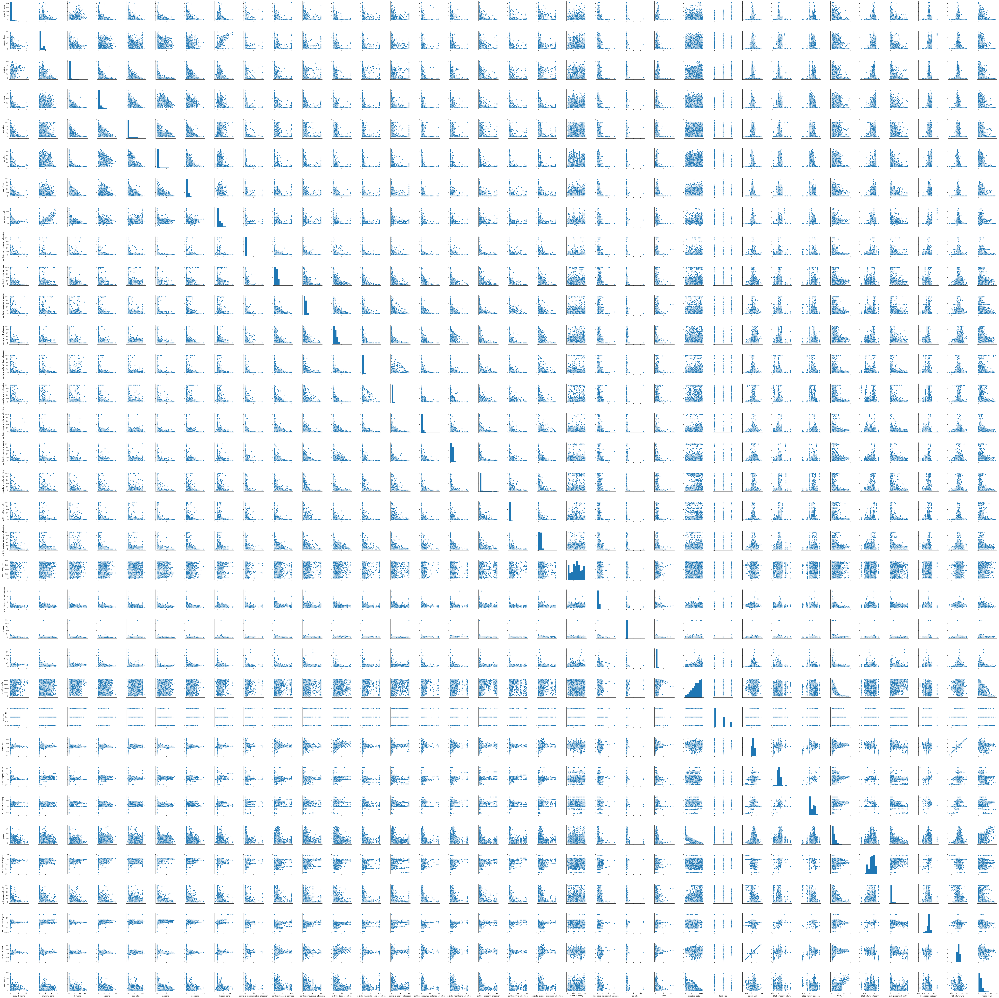

In [50]:
#sb.pairplot(X.iloc[:,:-1])

Co relation identification

In [372]:
from sklearn.ensemble import RandomForestClassifier
import sklearn.feature_extraction
from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import MultinomialNB
from sklearn.svm import SVC
import xgboost


/Users/shiva/anaconda3/anaconda3/lib/python3.7/site-packages/lightgbm/__init__.py:48: UserWarning: Starting from version 2.2.1, the library file in distribution wheels for macOS is built by the Apple Clang (Xcode_8.3.3) compiler.
This means that in case of installing LightGBM from PyPI via the ``pip install lightgbm`` command, you don't need to install the gcc compiler anymore.
Instead of that, you need to install the OpenMP library, which is required for running LightGBM on the system with the Apple Clang compiler.
You can install the OpenMP library by the following command: ``brew install libomp``.
  "You can install the OpenMP library by the following command: ``brew install libomp``.", UserWarning)


In [374]:
import lightgbm as lgb

Use Random forest feature extraction

In [376]:
lgb_train = lgb.Dataset(X, y)
lgb_eval = lgb.Dataset(X_test, y_test, reference=lgb_train)
params = {}
params['learning_rate'] = 0.05
params['boosting_type'] = 'gbdt'
#params['objective'] = 'huber'
params['metric'] = 'l2_root'
params['sub_feature'] = 0.5
params['num_leaves'] = 100
#params['min_data'] = 500
params['bagging_fraction'] = 0.8
params['bagging_freq'] = 1

clf = lgb.train(params,lgb_train,num_boost_round=10000,
                valid_sets=lgb_eval,early_stopping_rounds=100)

[1]	valid_0's rmse: 2.84046
Training until validation scores don't improve for 100 rounds
[2]	valid_0's rmse: 2.84129
[3]	valid_0's rmse: 2.84336
[4]	valid_0's rmse: 2.84565
[5]	valid_0's rmse: 2.84879
[6]	valid_0's rmse: 2.85197
[7]	valid_0's rmse: 2.85563
[8]	valid_0's rmse: 2.85985
[9]	valid_0's rmse: 2.86405
[10]	valid_0's rmse: 2.8684
[11]	valid_0's rmse: 2.87259
[12]	valid_0's rmse: 2.87761
[13]	valid_0's rmse: 2.88187
[14]	valid_0's rmse: 2.88645
[15]	valid_0's rmse: 2.89112
[16]	valid_0's rmse: 2.8959
[17]	valid_0's rmse: 2.90099
[18]	valid_0's rmse: 2.90558
[19]	valid_0's rmse: 2.90969
[20]	valid_0's rmse: 2.91455
[21]	valid_0's rmse: 2.91904
[22]	valid_0's rmse: 2.9235
[23]	valid_0's rmse: 2.92796
[24]	valid_0's rmse: 2.93199
[25]	valid_0's rmse: 2.93626
[26]	valid_0's rmse: 2.94036
[27]	valid_0's rmse: 2.94449
[28]	valid_0's rmse: 2.94861
[29]	valid_0's rmse: 2.95198
[30]	valid_0's rmse: 2.95563
[31]	valid_0's rmse: 2.95931
[32]	valid_0's rmse: 2.96293
[33]	valid_0's rmse: 2

In [378]:
y_pred_lgb = clf.predict(X_test)

In [ ]:
features_label = X.columns[1:]

In [ ]:
forest = RandomForestClassifier(n_estimators=50, random_state=0,n_jobs=-1)
forest.fit(X,y)
importances = forest.feature_importances_

In [ ]:
importances

In [ ]:
indices = np.argsort(importances)[::-1]
for i in range(X.shape[1]):
    print ((features_label[i]))

Find the Y column

In [ ]:
y_encoded = le.fit_transform(y)
y_encoded

Train test split 

In [67]:
from sklearn.model_selection import train_test_split

In [70]:
#X_train,X_test,y_train,y_test = train_test_split(X,y,random_state=300)

Model create,fit and Predict

In [126]:
X_test.shape

(5000, 121)

In [344]:
#mdl_log = LogisticRegression()
mdl_rf = RandomForestClassifier()
#mdl_SVC = SVC(C=5,degree=5)

In [361]:
mdl_rf = RandomForestClassifier(random_state=1,n_estimators=500)

In [362]:
mdl_xg = xgboost.XGBRFClassifier()

In [347]:
mdl_SVC = mdl_SVC.fit(X,y)

In [366]:
mdl_rf = mdl_rf.fit(X,y)

In [367]:
mdl_xg= mdl_xg.fit(X,y)

In [188]:
#y_pred_log = mdl_log.predict(X_test)

In [314]:
y_pred_svc = mdl_SVC.predict(X_test)

In [368]:
y_pred_rf = mdl_rf.predict(X_test)

In [369]:
y_pred_xg = mdl_xg.predict(X_test)

In [252]:
from sklearn.metrics import accuracy_score,precision_score,classification_report,confusion_matrix

In [253]:
#print ("logistic regression model accuracy  "+ str(accuracy_score(y_test,y_pred_log)))

In [352]:
print ("Random forest model accuracy "+ str(accuracy_score(y_test,y_pred_rf)))

Random forest model accuracy 0.068


In [359]:
print ("XG model accuracy "+ str(accuracy_score(y_test,y_pred_xg)))# 0.2698, 0.0708

XG model accuracy 0.0688


In [354]:
print ("SVC model accuracy "+ str(accuracy_score(y_test,y_pred_svc)))# 0.2698

SVC model accuracy 0.079


In [ ]:
y_pred_rf.shape

In [379]:
#print (confusion_matrix(y_test,y_pred_rf))
#print (classification_report(y_test,y_pred_rf))
precision_score(y_test,y_pred_lgb,average='micro')

ValueError: Classification metrics can't handle a mix of binary and continuous targets

# import tensorflow as tf
import tensorflow.keras
from tensorflow.keras import Sequential

In [206]:
model = tf.keras.models.Sequential()
model.add(tf.keras.layers.Dense(10, input_dim=120, activation='relu'))
model.add(tf.keras.layers.Dense(5, activation='sigmoid'))
model.add(tf.keras.layers.Dense(1, activation='softmax'))

In [207]:
sgd_optimizer = tf.keras.optimizers.SGD(lr=0.01)

In [208]:
model.compile(optimizer='sgd' ,loss='mean_squared_error', metrics=['accuracy'])

In [209]:
model.summary()

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_3 (Dense)              (None, 10)                1210      
_________________________________________________________________
dense_4 (Dense)              (None, 5)                 55        
_________________________________________________________________
dense_5 (Dense)              (None, 1)                 6         
Total params: 1,271
Trainable params: 1,271
Non-trainable params: 0
_________________________________________________________________


In [210]:
model.fit(X,y,          
          validation_data=(X_test,y_test),
          epochs=5,
          batch_size=5)

Train on 20000 samples, validate on 5000 samples
Epoch 1/5
20000/20000 [==============================] - 8s 403us/sample - loss: 5.0165 - accuracy: 0.0688 - val_loss: 1.0000 - val_accuracy: 0.0000e+00
Epoch 2/5
20000/20000 [==============================] - 8s 383us/sample - loss: 5.0165 - accuracy: 0.0688 - val_loss: 1.0000 - val_accuracy: 0.0000e+00
Epoch 3/5
20000/20000 [==============================] - 8s 422us/sample - loss: 5.0165 - accuracy: 0.0688 - val_loss: 1.0000 - val_accuracy: 0.0000e+00
Epoch 4/5
20000/20000 [==============================] - 9s 455us/sample - loss: 5.0165 - accuracy: 0.0688 - val_loss: 1.0000 - val_accuracy: 0.0000e+00
Epoch 5/5
20000/20000 [==============================] - 8s 416us/sample - loss: 5.0165 - accuracy: 0.0688 - val_loss: 1.0000 - val_accuracy: 0.0000e+00


In [211]:
y_pred = model.predict(X_test)

In [381]:
y_pred_df = pd.DataFrame(y_pred_lgb)

In [382]:
y_pred_df

,0
0,2.811415
1,2.879275
2,2.796018
3,2.856899
4,2.824478
...,...
4995,2.843367
4996,2.698734
4997,2.826269
4998,2.834921


Submission file creation with id

In [143]:
submission = pd.read_csv('/Users/shiva/Downloads/external 2/sample_submission.csv')

In [383]:
submission.greatstone_rating=y_pred_df
submission

,fund_id,greatstone_rating
4939,000b6091-3c16-41a1-9df4-fce73767dd21,2.859249
1389,00189098-b9b7-4dab-805f-6b70ec472fe4,2.845933
2939,001bb456-672e-4df5-9600-8ec3e45bf9dd,2.859249
1646,00401fbc-173e-4f10-a610-b4b89682d38f,2.789288
177,0043dd54-133c-4f14-b4ff-26e5467140b2,2.825241
...,...,...
3427,ffd2ce2c-760c-4c7d-89ca-b376b274d376,2.875092
3946,ffe7aba5-6c19-4778-b19d-d7f39e866417,2.846795
505,ffe94b91-ed0a-4ade-95ea-cea2cd23fb74,2.903078
4693,fff20861-acba-4818-9100-198deb1e4059,2.896528


In [384]:
Counter(submission.greatstone_rating)#Counter({2.0: 1023, 4.0: 1157, 1.0: 236, 3.0: 1994, 0.0: 354, 5.0: 236})- 76%

Counter({2.8592489854184624: 81,
         2.8459332310132135: 21,
         2.7892879230417944: 76,
         2.8252412533110838: 104,
         2.813882718569268: 67,
         2.8866030778262926: 114,
         2.8218101187989353: 188,
         2.8467947574748145: 91,
         2.8456596958348963: 67,
         2.8576495046743564: 136,
         2.877492228118494: 89,
         2.852273777407587: 35,
         2.823420394308865: 17,
         2.850061349798208: 35,
         2.823704528675995: 109,
         2.826269287010798: 63,
         2.6987343147393568: 313,
         2.8915347399084808: 100,
         2.9174346289024: 23,
         2.796018313657059: 24,
         2.875091691068426: 51,
         2.8525604790593637: 48,
         2.890711215942143: 47,
         2.867716627222272: 73,
         2.7789353385823374: 54,
         2.9072863072681994: 9,
         2.9138849466357915: 76,
         2.9030781123400526: 91,
         2.8359203942108313: 64,
         2.831450443081188: 33,
         2.83395652

In [321]:
submission.to_csv("Submission_pilot_7.csv")

In [80]:
chec = X

In [86]:
chec.iloc[:10,1:15]

,maturity_bond,b_rating,a_rating,aaa_rating,aa_rating,bbb_rating,duration_bond,portfolio_communication_allocation,portfolio_financial_services,portfolio_industrials_allocation,portfolio_tech_allocation,portfolio_materials_basic_allocation,portfolio_energy_allocation,portfolio_consumer_defence_allocation
0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,100.00,0.00
1,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.78,9.77,9.97,35.51,2.86,0.38,5.88
2,0.00,0.00,0.00,0.00,0.00,0.00,0.00,4.70,16.40,11.45,25.09,8.36,0.00,9.42
3,0.00,0.00,0.00,0.00,0.00,0.00,0.00,6.53,13.80,10.91,0.16,2.22,6.79,25.73
4,0.00,0.00,0.00,0.00,0.00,0.00,0.00,3.49,13.95,10.51,19.26,3.75,5.11,7.29
5,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,14.20,16.76,9.82,15.64,0.00,0.00
6,0.00,21.07,8.53,7.44,1.64,32.55,0.00,4.35,14.12,14.69,16.73,2.35,7.76,7.22
7,0.00,0.00,0.00,0.00,0.00,0.00,0.00,4.25,23.02,8.24,11.89,2.86,8.47,7.33
8,0.00,0.00,0.00,0.00,0.00,0.00,0.00,8.45,18.86,11.39,3.04,6.25,8.43,9.39
9,7.34,1.35,8.40,63.07,3.90,15.47,4.84,3.02,14.90,12.48,22.17,3.35,4.27,6.61


In [ ]:
from sklearn.metrics import precision_score

In [ ]:
precision_score(y_test,y_pred_rf,labels=[0,1,2,3,4,5],average='micro')

In [ ]:
precision_score(y_test,y_pred_xg,labels=[0,1,2,3,4,5],average='micro')